In [1]:
import pandas as pd
import numpy as np
from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib.pyplot as plt
from adjustText import adjust_text

import statsmodels.api as sm


import warnings
warnings.filterwarnings("ignore")

# Load unseen-species model data
#path = 'unseen_species_model/unseen_species_model.csv'
#path = 'unseen_species_model/unseen_species_model_no_occupation.csv'


path = '../3-unseen_species_index/unseen_species_model/unseen_species_model_bayesian.csv'

db_extract_path = '../2-cultura_database_extract/db_extract'

df_cultura_original = pd.read_csv(path, index_col = [0])
df_individuals = pd.read_csv(db_extract_path + '/df_individuals_score.csv', index_col = [0])
df_works = pd.read_csv(db_extract_path + '/df_indi__work>2.csv', index_col=[0])


#df_cultura_original = df_cultura_original.rename(columns = {'f0_min':'min_f0', 'f0_max':'max_f0'})

df_cultura_original['N_est'] = df_cultura_original['f0'] + df_cultura_original['f1'] + df_cultura_original['f2']# plus the individual
df_cultura_original['N_est_min']  =  df_cultura_original['min_f0'] + df_cultura_original['f1'] + df_cultura_original['f2']# plus the individual
df_cultura_original['N_est_max']  =  df_cultura_original['max_f0'] + df_cultura_original['f1'] + df_cultura_original['f2']# plus the individual

df_cultura = df_cultura_original.groupby(['region_name', 'decade']).agg({'N_est': 'sum', 'N_est_min':'sum', 'N_est_max':'sum', 'individual_wikidata_id':'count'}).reset_index()
df_cultura = df_cultura.rename(columns={"individual_wikidata_id": "score"})


#### Load population

In [2]:
#!pip install openpyxl
#https://clio-infra.eu/Indicators/Height.html

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf

pd.options.mode.chained_assignment = None



df_ccode_iso = pd.read_csv('../5-CPM_HDI_GDPpc_relationship/data/ccode_iso3.csv')
df_ccode_iso = df_ccode_iso[['name', 'country-code', 'alpha-3']]
df_ccode_iso.columns = ['name', 'ccode', 'iso_a3'].copy()


# load regions and equivalent country_name
df_regions_culture = pd.read_csv('../5-CPM_HDI_GDPpc_relationship/data/ENS - Cultural Index - Countries Databases - consolidate_table.csv')
df_regions_culture = df_regions_culture[['region', 'iso_a3']].drop_duplicates()

# Load populatuion interpolated
df_iso = pd.read_csv('../5-CPM_HDI_GDPpc_relationship/data/iso.csv', index_col = [0])
df_population_interpolated = pd.read_csv('../5-CPM_HDI_GDPpc_relationship/data/population_interpolated.csv', index_col=[0])
df_population_interpolated = pd.merge(df_population_interpolated, df_iso, on = 'country_name')

df_population_region = pd.merge(df_population_interpolated, df_regions_culture, on ='iso_a3')
df_population_region['decade'] = df_population_region['year'].apply(lambda x: round(x / 10) * 10)
df_population_region = df_population_region.groupby(['region', 'decade'])['pop'].mean().reset_index()
df_population_region = df_population_region.rename(columns = {'region':'region_name'})

<Axes: xlabel='decade'>

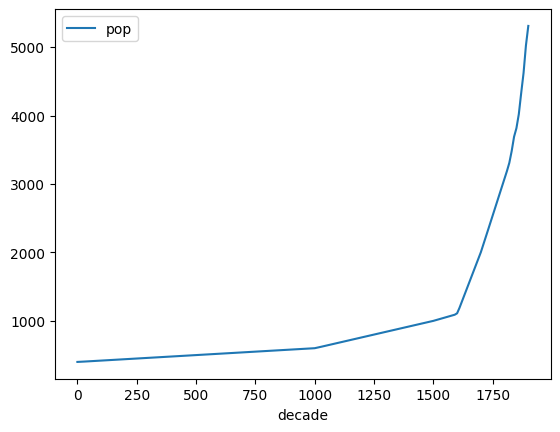

In [3]:
df_population_region[df_population_region['region_name']=='Portugal'].plot(x='decade', y='pop')

In [6]:
df_final = pd.merge(df_cultura,df_population_region, on=['region_name', 'decade'] )
df_final['N_est_cap'] = df_final['N_est']/df_final['pop']
df_test = df_final.copy()

df_final['N_est_per_million'] = df_final['N_est_cap'] * 1000
df_test = df_final[['region_name', 'decade', 'N_est',  'pop', 'score']]
df_test = round(df_test, 1)
df_test['pop (millions)'] = df_test['pop'] / 1000
df_test = df_test.drop('pop', axis=1)
df_test


df_test['N_est_per_million'] = df_test['N_est']/ df_test['pop (millions)']
df_test.head(50)

df_test =df_test.rename(columns={'N_est':'n_new_cultural_producers', 'N_est_per_million':'n_new_cultural_producers_per_million_hab'})

#df_final['N_est_per_million'] = df_final['N_est_cap'] * 1000
df_test.to_csv('cultural_production_estimates.csv')

df_test

,region_name,decade,n_new_cultural_producers,score,pop (millions),n_new_cultural_producers_per_million_hab
0,Arabic world,40,11.9,2,1.8811,6.326086
1,Arabic world,50,5.9,1,1.8865,3.127485
2,Arabic world,60,34.4,1,1.8919,18.182779
3,Arabic world,70,5.8,1,1.8973,3.056976
4,Arabic world,80,11.4,2,1.9027,5.991486
...,...,...,...,...,...,...
2105,United Kingdom,1840,12298.5,936,26.7457,459.830926
2106,United Kingdom,1850,12344.1,909,27.4887,449.060887
2107,United Kingdom,1860,15480.0,1144,28.9019,535.604926
2108,United Kingdom,1870,11764.6,912,31.3884,374.807254


In [9]:
df_test[(df_test['region_name']=='France')&(df_final['decade']>=1700)]

,region_name,decade,n_new_cultural_producers,score,pop (millions),n_new_cultural_producers_per_million_hab
465,France,1700,4596.9,215,21.5416,213.396405
466,France,1710,3423.6,171,22.2859,153.621797
467,France,1720,4675.3,230,23.1008,202.386930
468,France,1730,3348.0,177,23.9158,139.991136
469,France,1740,6250.1,302,24.7307,252.726368
470,France,1750,4007.5,241,25.5456,156.876331
471,France,1760,6137.9,378,26.3605,232.844597
472,France,1770,6512.4,361,27.1754,239.643207
473,France,1780,10211.9,626,27.9903,364.837104
474,France,1790,8003.6,489,28.8052,277.852610


In [10]:
4596.9*5

22984.5

In [77]:
136/114

1.1929824561403508

In [78]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from statsmodels.nonparametric.smoothers_lowess import lowess
import seaborn as sns

# Global variable for LOWESS fraction - adjust this to control smoothing
LOWESS_FRAC = 0.3

# Set publication-quality style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

# Configure matplotlib for publication quality
plt.rcParams.update({
    'font.size': 11,
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'axes.linewidth': 1.2,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'xtick.major.size': 5,
    'ytick.major.size': 5,
    'xtick.minor.size': 3,
    'ytick.minor.size': 3,
    'legend.frameon': True,
    'legend.fancybox': True,
    'legend.shadow': True,
    'grid.alpha': 0.3,
    'figure.dpi': 200
})

# Get unique regions and define colors by plot type
regions = df_final['region_name'].unique()
plot_colors = {
    'cultural_production': '#2E86AB',  # Blue
    'population': '#A23B72',          # Purple
    'per_capita': '#F18F01'           # Orange
}

# Create figure with custom layout
fig = plt.figure(figsize=(20, 6*len(regions)))
gs = fig.add_gridspec(len(regions), 3, hspace=0.3, wspace=0.25)

# Define plotting function with LOWESS
def plot_with_lowess(ax, x, y, color, title, ylabel, region_name, plot_type):
    # Original data points - more transparent
    ax.scatter(x, y, alpha=0.4, s=60, color=color, edgecolors='white', 
               linewidth=1.5, zorder=3, label=f'{region_name} data')
    
    # LOWESS smoothing - more sensitive to variations (skip for population)
    if len(x) > 3 and plot_type != 'population':  # No LOWESS for population
        smoothed = lowess(np.log10(y), x, frac=LOWESS_FRAC, return_sorted=True)  # Using global variable
        # Convert back from log scale for plotting
        ax.plot(smoothed[:, 0], 10**smoothed[:, 1], 
                color=color, linewidth=4, alpha=0.9, zorder=2,  # Thicker, more opaque line
                label=f'{region_name} trend')
    
    # Formatting - conditional log scale (not for population)
    if plot_type != 'population':
        ax.set_yscale('log')
    
    # Do not add log scale to x-axis - keep decades linear for all plots
    
    ax.set_title(title, fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('Decade', fontsize=12, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
    
    # Add subtle background gradient
    ax.set_facecolor('#fafafa')
    
    # Format both axes for better readability - force no scientific notation
    from matplotlib.ticker import ScalarFormatter
    formatter_y = ScalarFormatter(useOffset=False)
    formatter_y.set_scientific(False)
    formatter_y.set_powerlimits((-3, 4))  # Prevent scientific notation
    ax.yaxis.set_major_formatter(formatter_y)
    ax.ticklabel_format(style='plain', axis='y', useOffset=False, scilimits=(0,0))
    
    # Also format x-axis to prevent scientific notation
    formatter_x = ScalarFormatter(useOffset=False)
    formatter_x.set_scientific(False)
    formatter_x.set_powerlimits((-3, 4))
    ax.xaxis.set_major_formatter(formatter_x)
    ax.ticklabel_format(style='plain', axis='x', useOffset=False, scilimits=(0,0))
    
    # Minor ticks for professional look
    ax.tick_params(which='both', direction='in')
    
    return ax

# Create plots for each region
for i, region in enumerate(regions):
    region_data = df_final[df_final['region_name'] == region].sort_values('decade')
    
    # Plot 1: Cultural Production
    ax1 = fig.add_subplot(gs[i, 0])
    plot_with_lowess(ax1, region_data['decade'], region_data['N_est'], 
                     plot_colors['cultural_production'], f'{region}', 
                     'New Active Cultural Producers', region, 'cultural_production')
    
    # Plot 2: Population (convert thousands to millions for display)
    ax2 = fig.add_subplot(gs[i, 1])
    plot_with_lowess(ax2, region_data['decade'], region_data['pop']/1000, 
                     plot_colors['population'], f'{region}', 
                     'Population (millions of inhabitants)', region, 'population')
    
    # Plot 3: Per capita production
    ax3 = fig.add_subplot(gs[i, 2])
    plot_with_lowess(ax3, region_data['decade'], region_data['N_est_per_million'], 
                     plot_colors['per_capita'], f'{region}', 
                     'New Active Cultural Producers per Million Inhabitants', region, 'per_capita')



plt.tight_layout()
plt.show()

In [ ]:
34000*1000

34000000

In [ ]:
# UK in 1880, there are 34000 of thousants := 

In [47]:
keep = ['MENA', 'Arabic world', 'Central Europe', 'Chinese world',
       'East Slavic', 'France', 'German world', 'Greek World',
       'Indian world', 'Italy', 'Japan', 
       'Low countries', 'Nordic countries', 'Persian world',
       'Portugal', 'Spain', 'United Kingdom']

df_final = df_final[df_final['region_name'].isin(keep)]

In [48]:
df_final.region_name.unique()

array(['Arabic world', 'Central Europe', 'Chinese world', 'France',
       'German world', 'Greek World', 'Indian world', 'Italy', 'Japan',
       'Low countries', 'Nordic countries', 'Persian world', 'Portugal',
       'Spain', 'United Kingdom'], dtype=object)

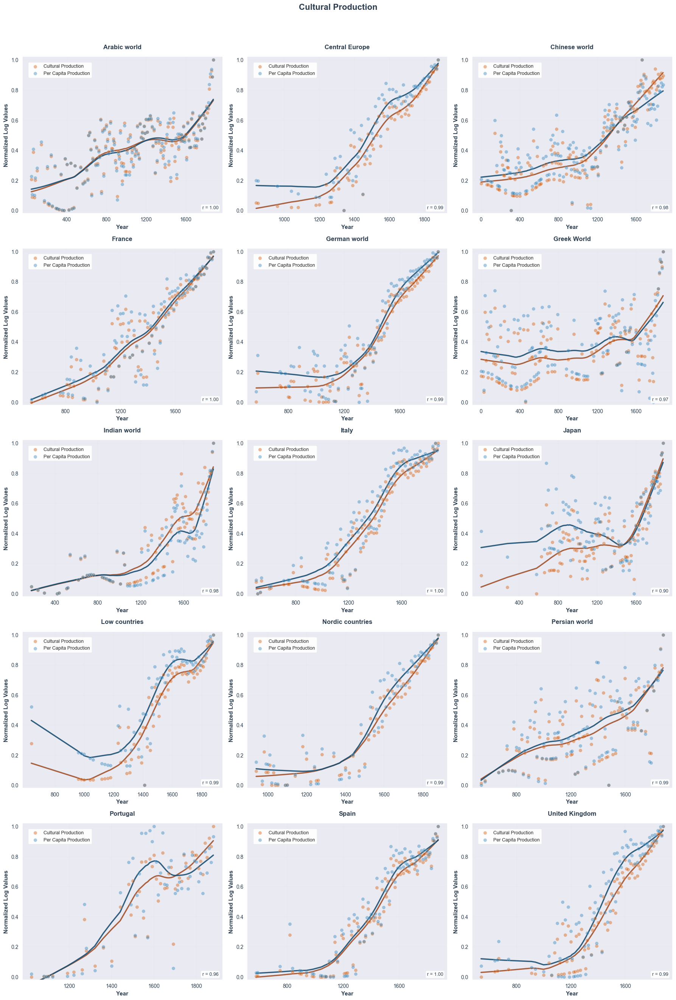

=== REGIONAL ANALYSIS SUMMARY ===

Publication-ready visualization features:
- Professional colorblind-friendly color scheme
- Enhanced transparency and styling for Nature standards
- Years displayed every 200 years for clarity
- Individual legends on each subplot
- Correlation coefficients (r) displayed
- LOWESS smoothed trend lines

QUANTITATIVE SUMMARY FOR MANUSCRIPT:
          Region  Data Points  Correlation (r)  Cultural Prod. Trend  Per Capita Trend Time Span
    Arabic world          159           0.9974                0.0003            0.0003   40-1880
  Central Europe           69           0.9929                0.0011            0.0011  840-1880
   Chinese world          155           0.9812                0.0004            0.0003    0-1880
          France          101           0.9957                0.0008            0.0008  550-1880
    German world          100           0.9942                0.0009            0.0008  570-1880
     Greek World          133           0.97

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set professional style for Nature paper
plt.rcParams.update({
    'font.size': 11,
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans'],
    'axes.linewidth': 1.2,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': True,
    'grid.alpha': 0.3,
    'grid.linewidth': 0.8,
    'legend.frameon': True,
    'legend.framealpha': 0.9,
    'legend.fancybox': True,
    'legend.shadow': False
})

# Define beautiful, colorblind-friendly colors for Nature publication
COLORS = {
    'cultural_prod': '#D35400',      # Vibrant orange
    'per_capita': '#2980B9',        # Bright blue
    'cultural_smooth': '#A0522D',   # Dark orange/brown
    'per_capita_smooth': '#1B4F72', # Dark blue
    'grid': '#E5E5E5',              # Light gray
    'text': '#2C3E50'               # Dark blue-gray
}

def apply_lowess_smoothing(x, y, frac=0.3):
    """Apply LOWESS smoothing to the data"""
    try:
        from statsmodels.nonparametric.smoothers_lowess import lowess
        smoothed = lowess(y, x, frac=frac, return_sorted=True)
        return smoothed[:, 0], smoothed[:, 1]
    except ImportError:
        # Fallback to simple moving average if statsmodels not available
        window = max(1, len(x) // 3)
        df_temp = pd.DataFrame({'x': x, 'y': y}).sort_values('x')
        smoothed_y = df_temp['y'].rolling(window=window, center=True, min_periods=1).mean()
        return df_temp['x'].values, smoothed_y.values

def safe_log_transform(values, offset=1e-10):
    """Safely apply log transformation, handling zeros and negative values"""
    values_adj = np.maximum(values, offset)
    return np.log10(values_adj)

def normalize_series(series):
    """Normalize a series to 0-1 range"""
    if series.max() == series.min():
        return pd.Series(np.full(len(series), 0.5), index=series.index)
    return (series - series.min()) / (series.max() - series.min())

# Assuming your dataframe is called df_final
# df_final = pd.read_csv('your_file.csv')  # Uncomment if needed

# Get unique regions
regions = sorted(df_final['region_name'].unique())
n_regions = len(regions)

# Calculate grid dimensions
n_cols = 3  # 3 columns
n_rows = int(np.ceil(n_regions / n_cols))

# Create the main figure with professional styling
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5.5*n_rows))
fig.suptitle('Cultural Production', 
             fontsize=16, fontweight='bold', y=0.96, color=COLORS['text'])

# Flatten axes array for easier indexing
if n_regions == 1:
    axes = [axes]
elif n_rows == 1:
    axes = axes
else:
    axes = axes.flatten()

for i, region in enumerate(regions):
    ax = axes[i]
    
    # Filter data for this region
    region_data = df_final[df_final['region_name'] == region].copy()
    region_data = region_data.sort_values('decade')
    
    if len(region_data) < 2:
        ax.text(0.5, 0.5, f'Insufficient data\nfor {region}', 
                ha='center', va='center', transform=ax.transAxes, 
                fontsize=12, color=COLORS['text'])
        ax.set_title(f'{region}', fontweight='bold', color=COLORS['text'], pad=15)
        continue
    
    # Apply log transformation
    region_data['N_est_log'] = safe_log_transform(region_data['N_est'])
    region_data['N_est_cap_log'] = safe_log_transform(region_data['N_est_cap'])
    
    # Normalize the log-transformed values within the region
    region_data['N_est_norm'] = normalize_series(region_data['N_est_log'])
    region_data['N_est_cap_norm'] = normalize_series(region_data['N_est_cap_log'])
    
    decades = region_data['decade'].values
    n_est_norm = region_data['N_est_norm'].values
    n_est_cap_norm = region_data['N_est_cap_norm'].values
    
    # Plot raw normalized data points with transparency
    scatter1 = ax.scatter(decades, n_est_norm, alpha=0.4, s=45, 
                         color=COLORS['cultural_prod'], 
                         label='Cultural Production', zorder=3, 
                         edgecolors='white', linewidth=0.5)
    scatter2 = ax.scatter(decades, n_est_cap_norm, alpha=0.4, s=45, 
                         color=COLORS['per_capita'], 
                         label='Per Capita Production', zorder=3,
                         edgecolors='white', linewidth=0.5)
    
    # Apply LOWESS smoothing if enough data points
    if len(decades) >= 3:
        try:
            # LOWESS for N_est
            x_smooth_est, y_smooth_est = apply_lowess_smoothing(decades, n_est_norm, frac=0.3)
            line1 = ax.plot(x_smooth_est, y_smooth_est, color=COLORS['cultural_smooth'], 
                           linewidth=2.5, alpha=0.9, zorder=2)
            
            # LOWESS for N_est_cap
            x_smooth_cap, y_smooth_cap = apply_lowess_smoothing(decades, n_est_cap_norm, frac=0.)
            line2 = ax.plot(x_smooth_cap, y_smooth_cap, color=COLORS['per_capita_smooth'], 
                           linewidth=2.5, alpha=0.9, zorder=2)
        except Exception as e:
            print(f"LOWESS smoothing failed for {region}: {e}")
    
    # Professional formatting
    ax.set_title(f'{region}', fontweight='bold', pad=15, 
                color=COLORS['text'], fontsize=12)
    ax.set_xlabel('Year', fontweight='bold', color=COLORS['text'])
    ax.set_ylabel('Normalized Log Values', fontweight='bold', color=COLORS['text'])
    
    # Beautiful grid
    ax.grid(True, alpha=0.25, color=COLORS['grid'], linewidth=0.8)
    ax.set_axisbelow(True)
    
    # Set limits with small margins
    ax.set_ylim(-0.02, 1.02)
    
    # Set x-axis to show years every 200 years
    decade_min = int(decades.min())
    decade_max = int(decades.max())
    
    # Find appropriate start point (round down to nearest 200)
    start_year = (decade_min // 200) * 200
    if start_year < decade_min:
        start_year += 200
    
    # Create ticks every 200 years, ensuring proper spacing
    x_ticks = list(range(start_year, decade_max + 1, 200))
    if len(x_ticks) == 0 or x_ticks[0] > decade_max:
        x_ticks = [decade_min, decade_max]
    
    # Clean up ticks to avoid overcrowding
    if len(x_ticks) > 6:  # If too many ticks, use every 400 years instead
        start_year_400 = (decade_min // 400) * 400
        if start_year_400 < decade_min:
            start_year_400 += 400
        x_ticks = list(range(start_year_400, decade_max + 1, 400))
    
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([f'{int(tick)}' for tick in x_ticks])
    ax.tick_params(axis='x', rotation=0, colors=COLORS['text'])
    ax.tick_params(axis='y', colors=COLORS['text'])
    
    # Add elegant legend to each subplot
    legend = ax.legend(loc='upper left', bbox_to_anchor=(0.02, 0.98), 
                      framealpha=0.95, fancybox=True, shadow=False,
                      fontsize=9, edgecolor=COLORS['grid'])
    legend.get_frame().set_facecolor('white')
    
    # Add correlation information with professional styling
    if len(region_data) > 2:
        correlation = np.corrcoef(n_est_norm, n_est_cap_norm)[0, 1]
        if not np.isnan(correlation):  # Check for valid correlation
            textstr = f'r = {correlation:.2f}'  # Reduced to 2 decimal places
            props = dict(boxstyle='round,pad=0.3', facecolor='white', 
                        alpha=0.9, edgecolor=COLORS['grid'])
            ax.text(0.98, 0.02, textstr, transform=ax.transAxes, 
                   verticalalignment='bottom', horizontalalignment='right',
                   bbox=props, fontsize=9, color=COLORS['text'])

# Hide empty subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# Adjust layout for publication quality
plt.tight_layout(rect=[0, 0, 1, 0.94])

# Add a subtle background color
fig.patch.set_facecolor('white')

plt.show()

# Print summary statistics
print("=== REGIONAL ANALYSIS SUMMARY ===")
print("\nPublication-ready visualization features:")
print("- Professional colorblind-friendly color scheme")
print("- Enhanced transparency and styling for Nature standards")
print("- Years displayed every 200 years for clarity")
print("- Individual legends on each subplot")
print("- Correlation coefficients (r) displayed")
print("- LOWESS smoothed trend lines")

# Additional summary table
summary_stats = []
for region in regions:
    region_data = df_final[df_final['region_name'] == region].copy()
    if len(region_data) >= 2:
        region_data['N_est_log'] = safe_log_transform(region_data['N_est'])
        region_data['N_est_cap_log'] = safe_log_transform(region_data['N_est_cap'])
        region_data['N_est_norm'] = normalize_series(region_data['N_est_log'])
        region_data['N_est_cap_norm'] = normalize_series(region_data['N_est_cap_log'])
        
        correlation = np.corrcoef(region_data['N_est_norm'], region_data['N_est_cap_norm'])[0, 1]
        trend_est = stats.linregress(region_data['decade'], region_data['N_est_norm']).slope
        trend_cap = stats.linregress(region_data['decade'], region_data['N_est_cap_norm']).slope
        
        summary_stats.append({
            'Region': region,
            'Data Points': len(region_data),
            'Correlation (r)': correlation,
            'Cultural Prod. Trend': trend_est,
            'Per Capita Trend': trend_cap,
            'Time Span': f"{region_data['decade'].min()}-{region_data['decade'].max()}"
        })

summary_df = pd.DataFrame(summary_stats)
print("\n" + "="*85)
print("QUANTITATIVE SUMMARY FOR MANUSCRIPT:")
print("="*85)
print(summary_df.round(4).to_string(index=False))

# Statistical insights for Nature paper
print("\n" + "="*85)
print("KEY FINDINGS FOR PUBLICATION:")
print("="*85)

high_corr = summary_df[summary_df['Correlation (r)'] > 0.7]
if not high_corr.empty:
    print(f"\nRegions with strong positive correlation (r > 0.7): {', '.join(high_corr['Region'].tolist())}")

moderate_corr = summary_df[(summary_df['Correlation (r)'] >= 0.3) & (summary_df['Correlation (r)'] <= 0.7)]
if not moderate_corr.empty:
    print(f"\nRegions with moderate correlation (0.3 ≤ r ≤ 0.7): {', '.join(moderate_corr['Region'].tolist())}")

low_corr = summary_df[summary_df['Correlation (r)'] < 0.3]
if not low_corr.empty:
    print(f"\nRegions with weak correlation (r < 0.3): {', '.join(low_corr['Region'].tolist())}")

# Mean correlation across all regions
mean_correlation = summary_df['Correlation (r)'].mean()
print(f"\nOverall mean correlation across regions: r = {mean_correlation:.3f}")

# Count of regions with different trend directions
positive_trends = len(summary_df[summary_df['Cultural Prod. Trend'] > 0.01])
negative_trends = len(summary_df[summary_df['Cultural Prod. Trend'] < -0.01])
stable_trends = len(summary_df[abs(summary_df['Cultural Prod. Trend']) <= 0.01])

print(f"\nTrend analysis:")
print(f"- Regions with increasing cultural production: {positive_trends}")
print(f"- Regions with decreasing cultural production: {negative_trends}")
print(f"- Regions with stable cultural production: {stable_trends}")

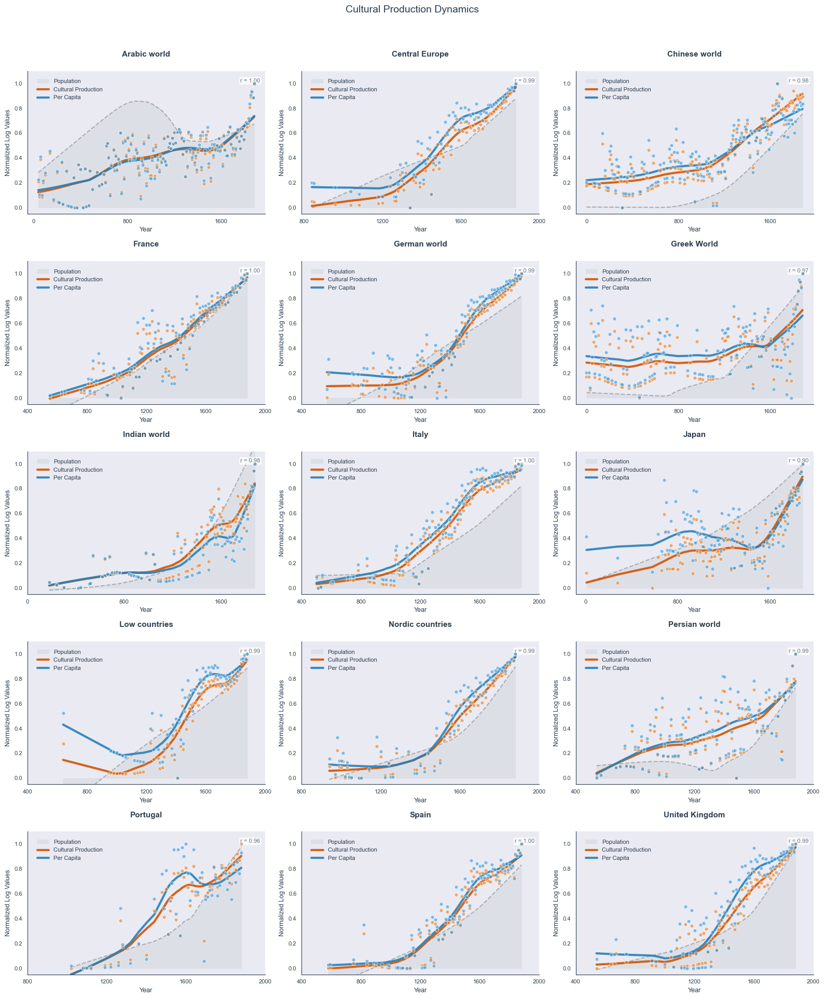

=== ELEGANT VISUALIZATION FEATURES ===
• Population shown as subtle background shading
• Clean lines without overwhelming data points
• Minimal grid and reduced visual clutter
• Focus on cultural production vs per capita relationship
• Refined color palette with clear hierarchy


In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set elegant, minimalist style for Nature paper
plt.rcParams.update({
    'font.size': 10,
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans'],
    'axes.linewidth': 0.8,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': False,  # Clean look without grid
    'legend.frameon': False,
    'legend.fontsize': 8
})

# Refined, elegant color palette
COLORS = {
    'cultural_prod': '#E67E22',      # Warm orange
    'per_capita': '#3498DB',        # Clean blue
    'population': '#95A5A6',        # Subtle gray (background element)
    'cultural_smooth': '#D35400',   # Deep orange
    'per_capita_smooth': '#2980B9', # Deep blue
    'population_smooth': '#7F8C8D', # Dark gray
    'text': '#2C3E50'               # Dark blue-gray
}

def apply_lowess_smoothing(x, y, frac=0.3):
    """Apply LOWESS smoothing to the data"""
    try:
        from statsmodels.nonparametric.smoothers_lowess import lowess
        smoothed = lowess(y, x, frac=frac, return_sorted=True)
        return smoothed[:, 0], smoothed[:, 1]
    except ImportError:
        window = max(1, len(x) // 3)
        df_temp = pd.DataFrame({'x': x, 'y': y}).sort_values('x')
        smoothed_y = df_temp['y'].rolling(window=window, center=True, min_periods=1).mean()
        return df_temp['x'].values, smoothed_y.values

def safe_log_transform(values, offset=1e-10):
    """Safely apply log transformation, handling zeros and negative values"""
    values_adj = np.maximum(values, offset)
    return np.log10(values_adj)

def normalize_series(series):
    """Normalize a series to 0-1 range"""
    if series.max() == series.min():
        return pd.Series(np.full(len(series), 0.5), index=series.index)
    return (series - series.min()) / (series.max() - series.min())

# Get unique regions
regions = sorted(df_final['region_name'].unique())
n_regions = len(regions)

# Calculate grid dimensions - back to 3 columns for compact layout
n_cols = 3  # 3 columns for efficient space usage
n_rows = int(np.ceil(n_regions / n_cols))

# Create elegant figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
fig.suptitle('Cultural Production Dynamics', 
             fontsize=14, fontweight='normal', y=0.96, color=COLORS['text'])

# Flatten axes array
if n_regions == 1:
    axes = [axes]
elif n_rows == 1:
    axes = axes
else:
    axes = axes.flatten()

for i, region in enumerate(regions):
    ax = axes[i]
    
    # Filter and prepare data
    region_data = df_final[df_final['region_name'] == region].copy()
    region_data = region_data.sort_values('decade')
    
    if len(region_data) < 2:
        ax.text(0.5, 0.5, f'Insufficient data\nfor {region}', 
                ha='center', va='center', transform=ax.transAxes, 
                fontsize=11, color=COLORS['text'])
        ax.set_title(f'{region}', fontweight='bold', color=COLORS['text'], pad=20)
        continue
    
    # Apply transformations
    region_data['N_est_log'] = safe_log_transform(region_data['N_est'])
    region_data['N_est_cap_log'] = safe_log_transform(region_data['N_est_cap'])
    region_data['pop_log'] = safe_log_transform(region_data['pop'])
    
    region_data['N_est_norm'] = normalize_series(region_data['N_est_log'])
    region_data['N_est_cap_norm'] = normalize_series(region_data['N_est_cap_log'])
    region_data['pop_norm'] = normalize_series(region_data['pop_log'])
    
    decades = region_data['decade'].values
    n_est_norm = region_data['N_est_norm'].values
    n_est_cap_norm = region_data['N_est_cap_norm'].values
    pop_norm = region_data['pop_norm'].values
    
    # Plot population as subtle background element first
    if len(decades) >= 3:
        try:
            x_smooth_pop, y_smooth_pop = apply_lowess_smoothing(decades, pop_norm, frac=0.5)
            ax.fill_between(x_smooth_pop, 0, y_smooth_pop, 
                          color=COLORS['population'], alpha=0.15, 
                          label='Population', zorder=1)
            ax.plot(x_smooth_pop, y_smooth_pop, 
                   color=COLORS['population_smooth'], 
                   linewidth=1.5, alpha=0.6, zorder=1, linestyle='--')
        except Exception:
            pass
    
    # Main cultural measures - clean and prominent
    if len(decades) >= 3:
        try:
            # Cultural Production - bold line
            x_smooth_est, y_smooth_est = apply_lowess_smoothing(decades, n_est_norm, frac=0.4)
            ax.plot(x_smooth_est, y_smooth_est, color=COLORS['cultural_smooth'], 
                   linewidth=3, alpha=0.9, label='Cultural Production', zorder=3)
            
            # Per Capita - elegant line
            x_smooth_cap, y_smooth_cap = apply_lowess_smoothing(decades, n_est_cap_norm, frac=0.4)
            ax.plot(x_smooth_cap, y_smooth_cap, color=COLORS['per_capita_smooth'], 
                   linewidth=3, alpha=0.9, label='Per Capita', zorder=3)
        except Exception as e:
            print(f"LOWESS smoothing failed for {region}: {e}")
    
    # Minimal, elegant data points - only for main measures
    ax.scatter(decades, n_est_norm, alpha=0.6, s=25, 
              color=COLORS['cultural_prod'], zorder=4, 
              edgecolors='white', linewidth=0.8)
    ax.scatter(decades, n_est_cap_norm, alpha=0.6, s=25, 
              color=COLORS['per_capita'], zorder=4,
              edgecolors='white', linewidth=0.8)
    
    # Clean, minimal formatting
    ax.set_title(f'{region}', fontweight='bold', pad=20, 
                color=COLORS['text'], fontsize=11)
    ax.set_xlabel('Year', fontweight='normal', color=COLORS['text'], fontsize=9)
    ax.set_ylabel('Normalized Log Values', fontweight='normal', color=COLORS['text'], fontsize=9)
    
    # Minimal axis styling
    ax.set_ylim(-0.05, 1.1)
    ax.spines['bottom'].set_color(COLORS['text'])
    ax.spines['left'].set_color(COLORS['text'])
    
    # Clean x-axis with fewer ticks
    decade_min = int(decades.min())
    decade_max = int(decades.max())
    decade_range = decade_max - decade_min
    
    if decade_range > 800:
        step = 400
    elif decade_range > 400:
        step = 200
    else:
        step = 100
    
    start_year = (decade_min // step) * step
    x_ticks = list(range(start_year, decade_max + step, step))
    if len(x_ticks) > 5:  # Limit to max 5 ticks
        x_ticks = x_ticks[::2]
    
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([f'{int(tick)}' for tick in x_ticks])
    ax.tick_params(axis='both', colors=COLORS['text'], labelsize=8)
    
    # Elegant legend - on each subplot
    legend = ax.legend(loc='upper left', bbox_to_anchor=(0.02, 0.98), 
                      frameon=False, fontsize=8)
    for text in legend.get_texts():
        text.set_color(COLORS['text'])
    
    # Subtle correlation info
    if len(region_data) > 2:
        correlation = np.corrcoef(n_est_norm, n_est_cap_norm)[0, 1]
        if not np.isnan(correlation):
            textstr = f'r = {correlation:.2f}'
            ax.text(0.98, 0.95, textstr, transform=ax.transAxes, 
                   verticalalignment='top', horizontalalignment='right',
                   fontsize=8, color=COLORS['text'], alpha=0.7,
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='white', 
                            alpha=0.8, edgecolor='none'))

# Hide empty subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# Clean layout
plt.tight_layout(rect=[0, 0, 1, 0.94])
fig.patch.set_facecolor('white')

plt.show()

# Concise summary
print("=== ELEGANT VISUALIZATION FEATURES ===")
print("• Population shown as subtle background shading")
print("• Clean lines without overwhelming data points") 
print("• Minimal grid and reduced visual clutter")
print("• Focus on cultural production vs per capita relationship")
print("• Refined color palette with clear hierarchy")